# EDA - Explenatory Data Analysis

In [80]:
import matplotlib as plt
import pandas as pd
import numpy as np
import warnings
import seaborn as sns
import matplotlib.pyplot as plt
warnings.filterwarnings("ignore")
%matplotlib inline

In [81]:
df = pd.read_pickle(r'spotify_songs_df_after_data_prep_9.3.25.pkl')


In [82]:
df.shape

(28356, 20)

In [83]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 28356 entries, 0 to 32832
Data columns (total 20 columns):
 #   Column                         Non-Null Count  Dtype         
---  ------                         --------------  -----         
 0   track_id                       28356 non-null  string        
 1   track_artist                   28352 non-null  string        
 2   track_popularity               28356 non-null  int64         
 3   track_album_id                 28356 non-null  string        
 4   track_album_release_date       26675 non-null  datetime64[ns]
 5   danceability                   28356 non-null  float64       
 6   energy                         28356 non-null  float64       
 7   key                            28356 non-null  int64         
 8   loudness                       28356 non-null  float64       
 9   mode                           28356 non-null  int64         
 10  speechiness                    28356 non-null  float64       
 11  acousticness        

In [84]:
pd.set_option('display.width', 200)  # Adjust width
pd.set_option('display.max_columns', None)  # Show all columns
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 28356 entries, 0 to 32832
Data columns (total 20 columns):
 #   Column                         Non-Null Count  Dtype         
---  ------                         --------------  -----         
 0   track_id                       28356 non-null  string        
 1   track_artist                   28352 non-null  string        
 2   track_popularity               28356 non-null  int64         
 3   track_album_id                 28356 non-null  string        
 4   track_album_release_date       26675 non-null  datetime64[ns]
 5   danceability                   28356 non-null  float64       
 6   energy                         28356 non-null  float64       
 7   key                            28356 non-null  int64         
 8   loudness                       28356 non-null  float64       
 9   mode                           28356 non-null  int64         
 10  speechiness                    28356 non-null  float64       
 11  acousticness        

In [85]:
from IPython.core.display import HTML

table_html = """
<style>
    table {
        width: 100%;
        border-collapse: collapse;
        font-family: Arial, sans-serif;
    }
    th, td {
        border: 1px solid #ddd;
        padding: 8px;
        text-align: right; /* Right align text */
    }
    th {
        background-color: #4CAF50;
        color: white;
    }
    tr:nth-child(even) {
        background-color: #f2f2f2;
    }
    tr:hover {
        background-color: #ddd;
    }
</style>

<table>
    <tr>
        <th>Variable</th>
        <th>Description</th>
    </tr>
    <tr>
        <td><b>track_id</b></td>
        <td>Unique identifier for the song.</td>
    </tr>
    <tr>
        <td><b>track_artist</b></td>
        <td>Name of the artist who performed the song.</td>
    </tr>
    <tr>
        <td><b>track_popularity</b></td>
        <td>Popularity score of the song (0-100), where a higher value indicates greater popularity.</td>
    </tr>
    <tr>
        <td><b>track_album_id</b></td>
        <td>Unique identifier for the album.</td>
    </tr>
    <tr>
        <td><b>track_album_release_date</b></td>
        <td>Date when the album was released.</td>
    </tr>
    <tr>
        <td><b>danceability</b></td>
        <td>Measures how suitable a track is for dancing (0.0 - least danceable, 1.0 - most danceable).</td>
    </tr>
    <tr>
        <td><b>energy</b></td>
        <td>Represents intensity and activity (0.0 - low energy, 1.0 - high energy).</td>
    </tr>
    <tr>
        <td><b>key</b></td>
        <td>Estimated key of the track, mapped to pitch classes (e.g., 0 = C, 1 = C♯/D♭, etc.).</td>
    </tr>
    <tr>
        <td><b>loudness</b></td>
        <td>Overall loudness of the track in decibels (dB), typically ranging from -60 to 0 dB.</td>
    </tr>
    <tr>
        <td><b>mode</b></td>
        <td>Indicates modality: 1 = Major, 0 = Minor.</td>
    </tr>
    <tr>
        <td><b>speechiness</b></td>
        <td>Measures presence of spoken words (higher values indicate more speech-like content).</td>
    </tr>
    <tr>
        <td><b>acousticness</b></td>
        <td>Confidence measure (0.0 - low, 1.0 - high) indicating whether a track is acoustic.</td>
    </tr>
    <tr>
        <td><b>instrumentalness</b></td>
        <td>Predicts whether a track has vocals (higher values suggest an instrumental track).</td>
    </tr>
    <tr>
        <td><b>liveness</b></td>
        <td>Detects audience presence (higher values suggest a live recording).</td>
    </tr>
    <tr>
        <td><b>valence</b></td>
        <td>Measures musical positiveness (0.0 - sad/negative, 1.0 - happy/positive).</td>
    </tr>
    <tr>
        <td><b>tempo</b></td>
        <td>Estimated tempo of the track in beats per minute (BPM).</td>
    </tr>
    <tr>
        <td><b>duration_minutes</b></td>
        <td>Duration of the track in minutes.</td>
    </tr>
    <tr>
        <td><b>track_album_release_date_year</b></td>
        <td>Temporary column used for exploratory data analysis (EDA).</td>
    </tr>
    <tr>
        <td><b>playlist_count_per_song</b></td>
        <td>Number of playlists containing the track.</td>
    </tr>
    <tr>
        <td><b>playlist_genre_count_per_song</b></td>
        <td>Number of unique playlist genres associated with the track.</td>
    </tr>
</table>
"""

HTML(table_html)


Variable,Description
track_id,Unique identifier for the song.
track_artist,Name of the artist who performed the song.
track_popularity,"Popularity score of the song (0-100), where a higher value indicates greater popularity."
track_album_id,Unique identifier for the album.
track_album_release_date,Date when the album was released.
danceability,"Measures how suitable a track is for dancing (0.0 - least danceable, 1.0 - most danceable)."
energy,"Represents intensity and activity (0.0 - low energy, 1.0 - high energy)."
key,"Estimated key of the track, mapped to pitch classes (e.g., 0 = C, 1 = C♯/D♭, etc.)."
loudness,"Overall loudness of the track in decibels (dB), typically ranging from -60 to 0 dB."
mode,"Indicates modality: 1 = Major, 0 = Minor."


## Data Protocol

In [86]:
# Type of valaues
df.dtypes.to_excel("spotify_datatype.xlsx",
             sheet_name='data_type')
# Maximum valaues
df.max().to_excel("max_spotify.xlsx",
             sheet_name='max')
# Minimum Values
df.min().to_excel("min_spotify.xlsx",
             sheet_name='min')
# Missing Values
df.isnull().sum(axis=0).to_excel("NA_spotify.xlsx",
             sheet_name='NA')
# exporting results to the protocol
df.nunique().to_excel("unique_spotifyr.xlsx",
             sheet_name='unique')

## Descriptive Statistics

#Automated reports

In [87]:
### AutoViz

Shape of your Data Set loaded: (28356, 20)
#######################################################################################
######################## C L A S S I F Y I N G  V A R I A B L E S  ####################
#######################################################################################
Classifying variables in data set...
    Number of Numeric Columns =  11
    Number of Integer-Categorical Columns =  4
    Number of String-Categorical Columns =  0
    Number of Factor-Categorical Columns =  0
    Number of String-Boolean Columns =  0
    Number of Numeric-Boolean Columns =  1
    Number of Discrete String Columns =  0
    Number of NLP String Columns =  3
    Number of Date Time Columns =  0
    Number of ID Columns =  1
    Number of Columns to Delete =  0
    20 Predictors classified...
        1 variable(s) removed since they were ID or low-information variables
        List of variables removed: ['track_id']
To fix these data quality issues in the dataset, impo

,Data Type,Missing Values%,Unique Values%,Minimum Value,Maximum Value,DQ Issue
track_id,object,0.000000,100,,,Possible ID column: drop before modeling step.
track_artist,object,0.239808,37,,,"68 missing values. Impute them with mean, median, mode, or a constant value such as 123., Mixed dtypes: has 2 different data types: object, float,"
track_popularity,int64,0.000000,0,0.000000,100.000000,No issue
track_album_id,object,0.000000,79,,,No issue
track_album_release_date,object,5.928199,15,,,"1681 missing values. Impute them with mean, median, mode, or a constant value such as 123., Mixed dtypes: has 2 different data types: object, float,"
danceability,float64,0.000000,NA,0.000000,0.983000,Column has 257 outliers greater than upper bound (1.06) or lower than lower bound(0.26). Cap them or remove them.
energy,float64,0.000000,NA,0.000175,1.000000,Column has 222 outliers greater than upper bound (1.24) or lower than lower bound(0.18). Cap them or remove them.
key,int64,0.000000,0,0.000000,11.000000,No issue
loudness,float64,0.000000,NA,-46.448000,1.275000,Column has 837 outliers greater than upper bound (0.69) or lower than lower bound(-13.71). Cap them or remove them.
mode,int64,0.000000,0,0.000000,1.000000,No issue


Number of All Scatter Plots = 66


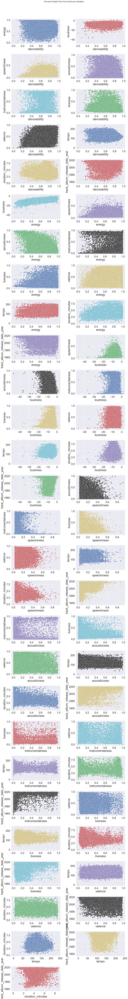

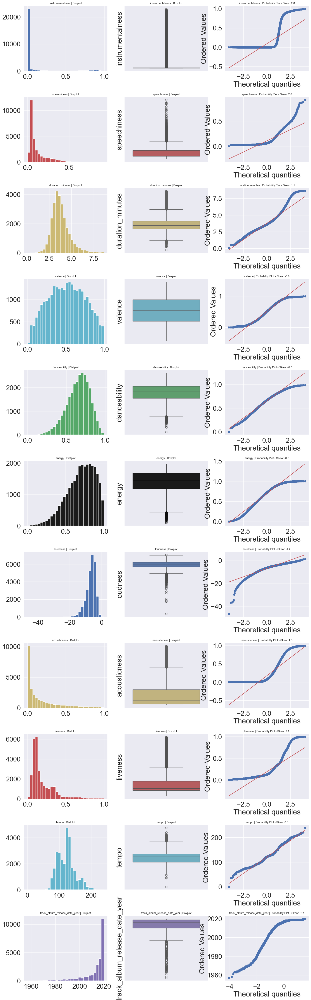

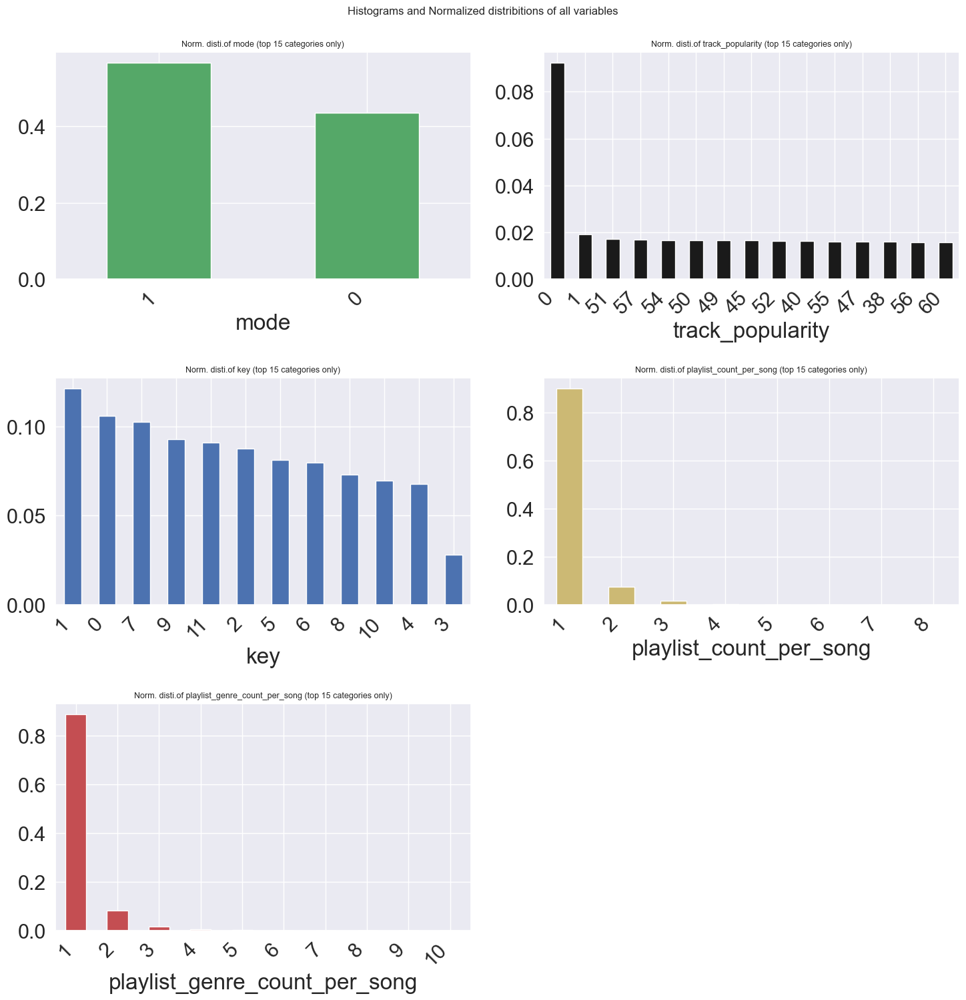

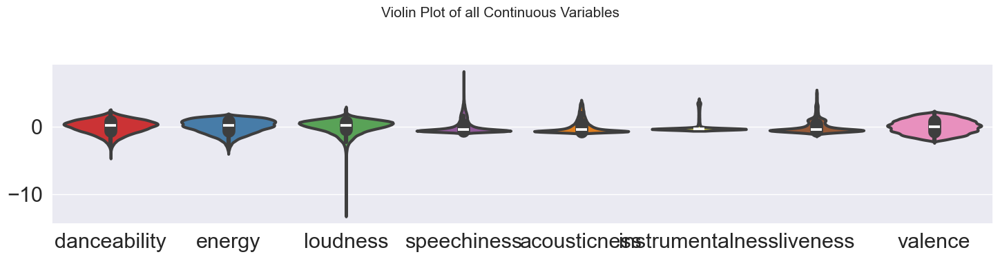

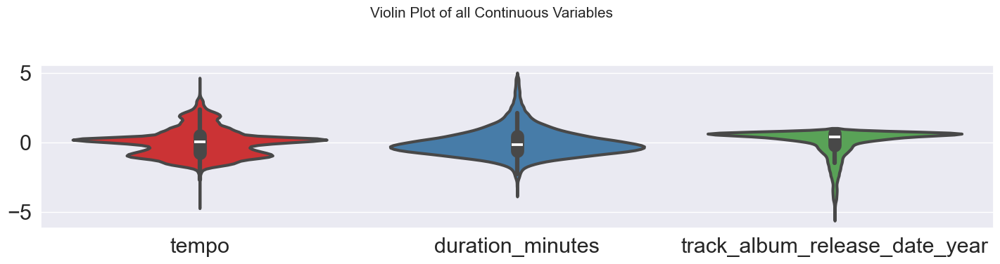

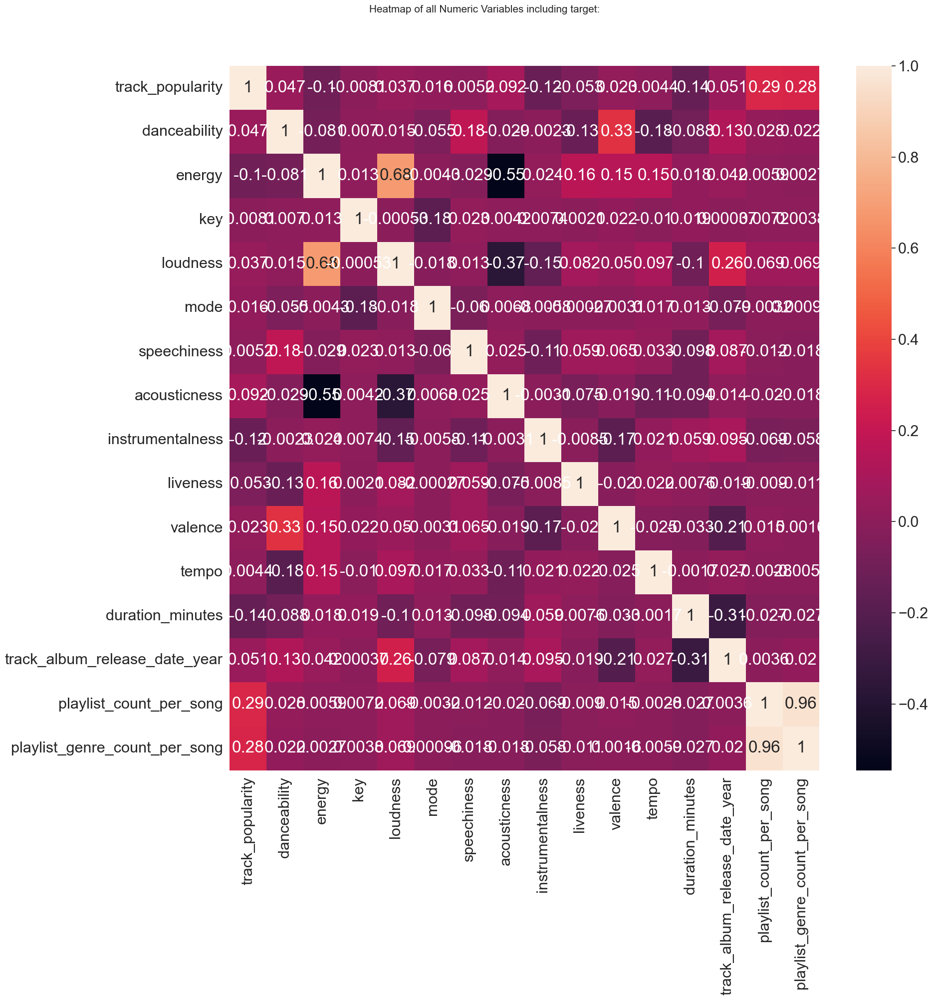

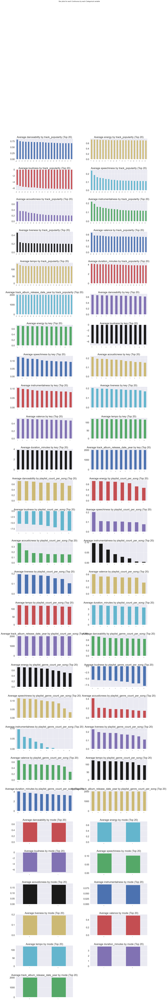

[nltk_data] Downloading collection 'popular'
[nltk_data]    | 
[nltk_data]    | Downloading package cmudict to C:\Users\Meital
[nltk_data]    |     atar\AppData\Roaming\nltk_data...
[nltk_data]    |   Package cmudict is already up-to-date!
[nltk_data]    | Downloading package gazetteers to C:\Users\Meital
[nltk_data]    |     atar\AppData\Roaming\nltk_data...
[nltk_data]    |   Package gazetteers is already up-to-date!
[nltk_data]    | Downloading package genesis to C:\Users\Meital
[nltk_data]    |     atar\AppData\Roaming\nltk_data...
[nltk_data]    |   Package genesis is already up-to-date!
[nltk_data]    | Downloading package gutenberg to C:\Users\Meital
[nltk_data]    |     atar\AppData\Roaming\nltk_data...
[nltk_data]    |   Package gutenberg is already up-to-date!
[nltk_data]    | Downloading package inaugural to C:\Users\Meital
[nltk_data]    |     atar\AppData\Roaming\nltk_data...
[nltk_data]    |   Package inaugural is already up-to-date!
[nltk_data]    | Downloading package m

Could not draw wordcloud plot for track_artist. 
Looks like you are missing some required data for this feature.

To download the necessary data, simply run

    python -m textblob.download_corpora

or use the NLTK downloader to download the missing data: http://nltk.org/data.html
If this doesn't fix the problem, file an issue at https://github.com/sloria/TextBlob/issues.

Could not draw wordcloud plot for track_album_id. 
Looks like you are missing some required data for this feature.

To download the necessary data, simply run

    python -m textblob.download_corpora

or use the NLTK downloader to download the missing data: http://nltk.org/data.html
If this doesn't fix the problem, file an issue at https://github.com/sloria/TextBlob/issues.

Could not draw wordcloud plot for track_album_release_date. 
Looks like you are missing some required data for this feature.

To download the necessary data, simply run

    python -m textblob.download_corpora

or use the NLTK downloader to downl

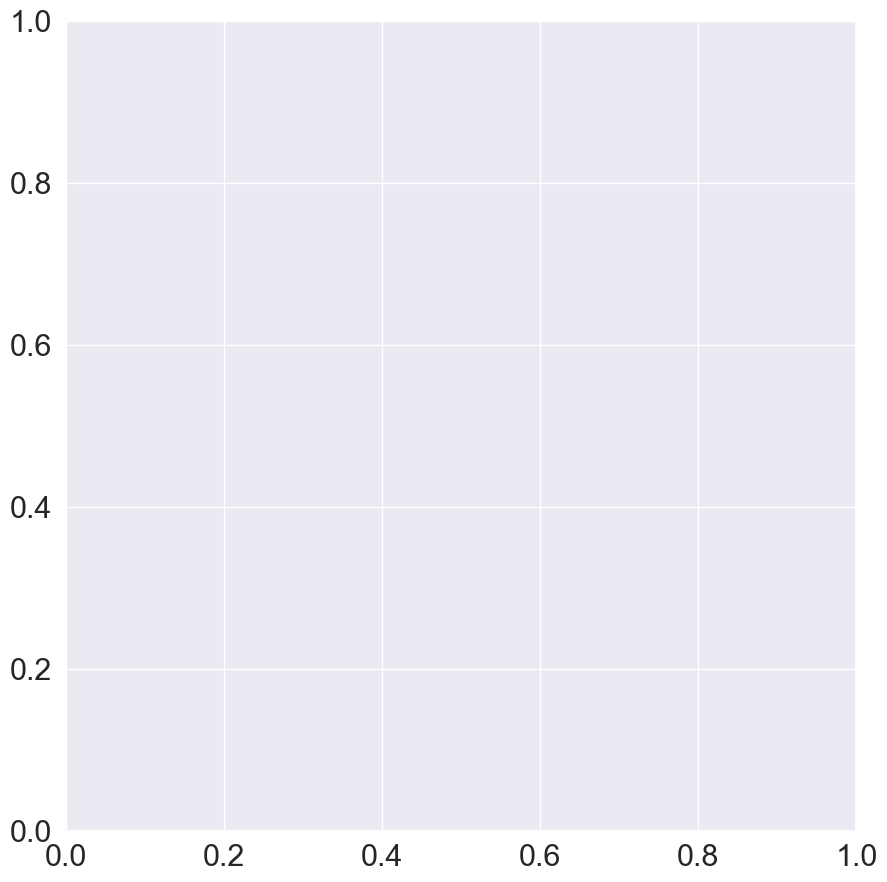

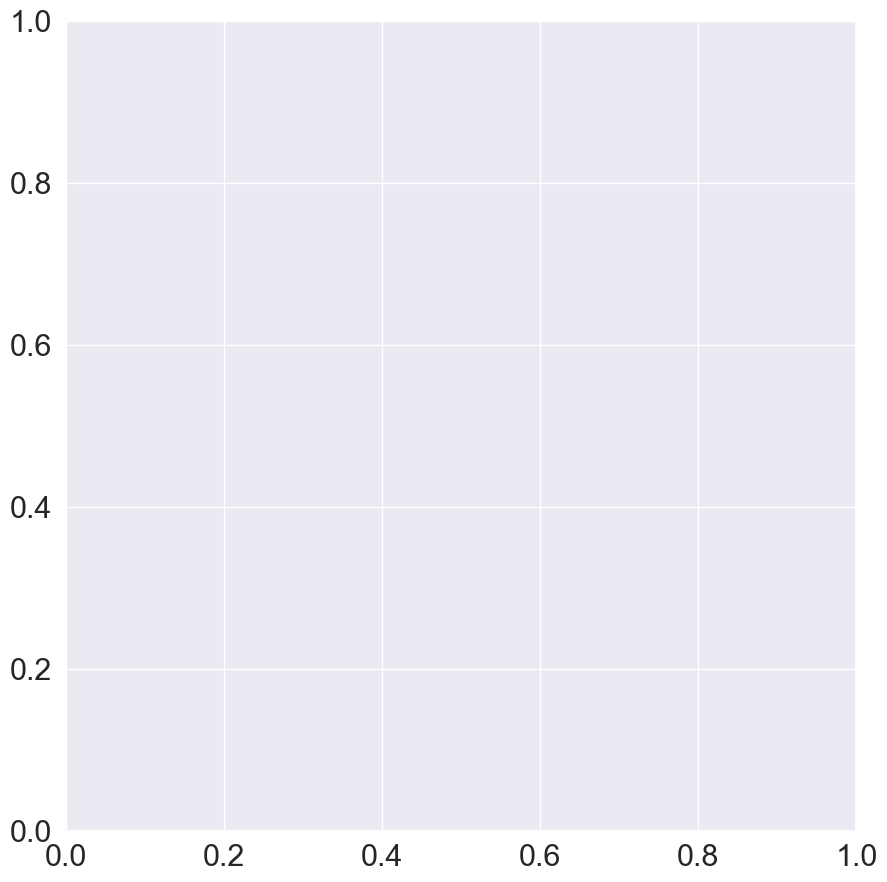

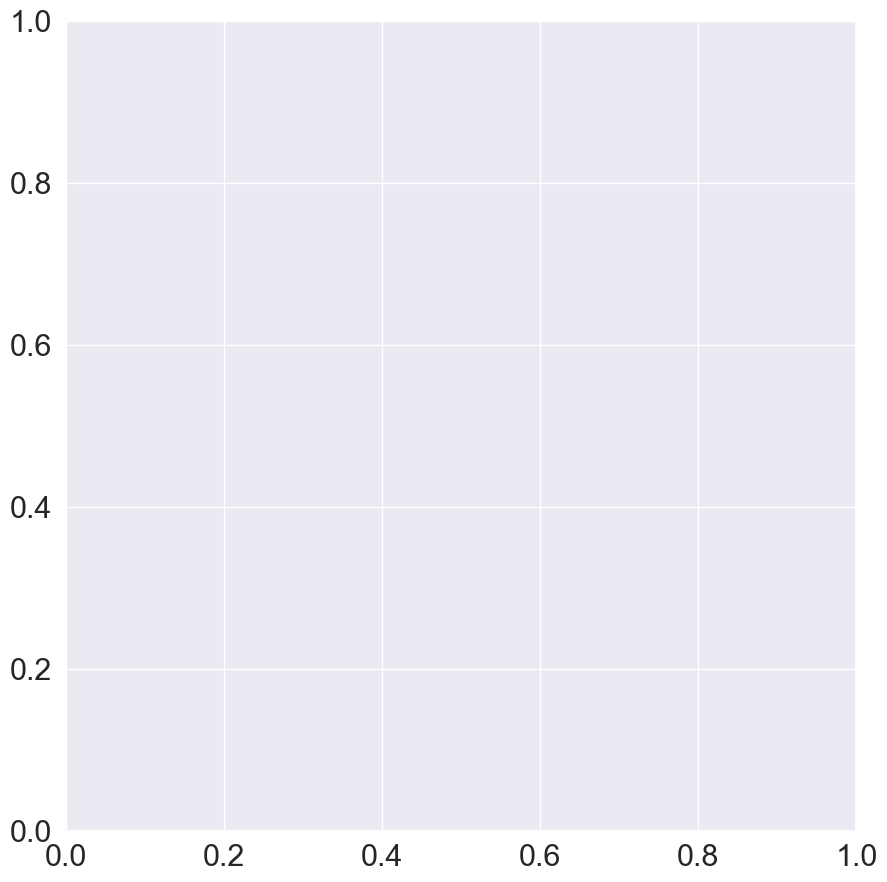

In [88]:
from autoviz.AutoViz_Class import AutoViz_Class
%matplotlib inline

AV = AutoViz_Class()
AV.AutoViz('sorted_spotify_songs_data.csv')

import matplotlib.pyplot as plt
plt.show()


## dummies

In [89]:
#avg_track_popularity_above60 = df[df['track_popularity'] >=65]['track_popularity'].mean()
#avg_track_popularity_under60 = df[df['track_popularity'] < 65]['track_popularity'].mean()

#print(f"Average Track Popularity_above60 : {avg_track_popularity_above60}")
#print(f"Average Track Popularity_under60 : {avg_track_popularity_under60}")
#check it

In [90]:
cols= ['loudness','speechiness','acousticness','instrumentalness','liveness','valence','tempo','danceability','energy','duration_minutes'
       ,'track_popularity']
con_df = df[cols]

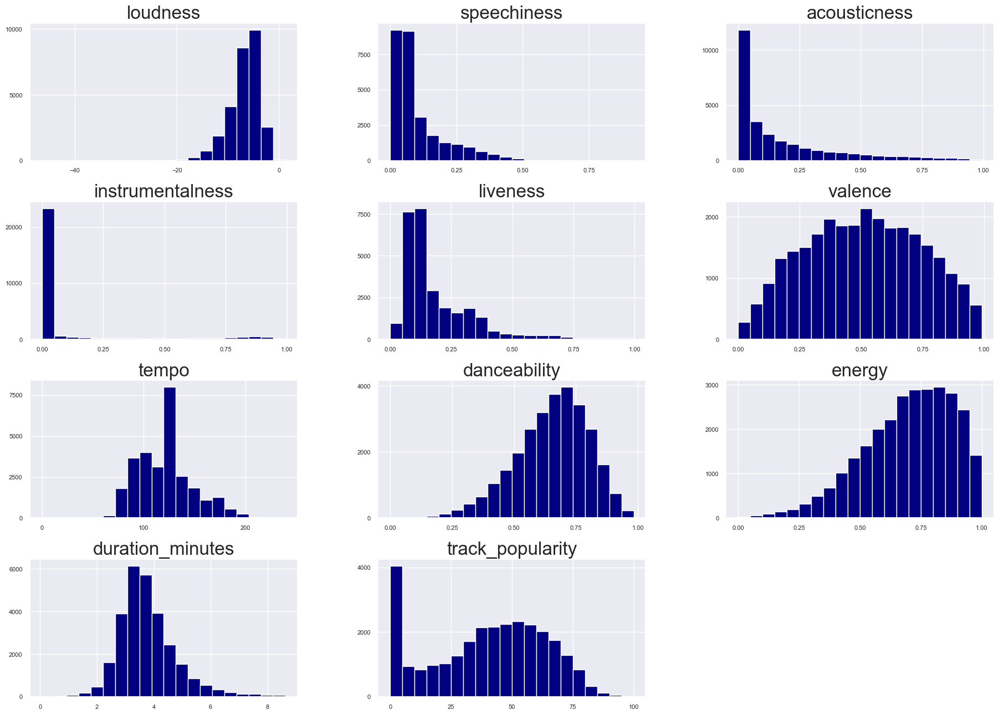

In [91]:

cols = ['loudness', 'speechiness', 'acousticness', 'instrumentalness', 'liveness', 
        'valence', 'tempo', 'danceability', 'energy', 'duration_minutes', 'track_popularity']

# Ensure only numeric columns
con_df = con_df[cols].dropna()

# Plot histograms
con_df.hist(figsize=(20, 15), bins=20, xlabelsize=8, ylabelsize=8, color="navy")
plt.show()

## Categorials

In [92]:
new_df=['track_id', 'track_artist', 'track_album_id']
df_cat= df[new_df]

In [93]:
df_cat.info()

<class 'pandas.core.frame.DataFrame'>
Index: 28356 entries, 0 to 32832
Data columns (total 3 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   track_id        28356 non-null  string
 1   track_artist    28352 non-null  string
 2   track_album_id  28356 non-null  string
dtypes: string(3)
memory usage: 886.1 KB


In [ ]:
a=3 #number of rows 
b=3 #number of columns
c=1 #plot counter

fig=plt.figure(figsize=(50,40))
plt.subplots_adjust(hspace = 0.8)
sns.set(font_scale = 2)
for i in df_cat:
    
    plt.subplot(a,b,c)
    plt.title('{}'.format(i))
    plt.xlabel(i)
    sns.countplot(df_cat[i])
    c=c+1

plt.show()
    

## Target Value

In [ ]:
sb.countplot(x='track_popularity', data=df)

In [ ]:
#creating df_dummy
#df_dummy=df['popularity_group','mode']
#df_dummy

In [ ]:
plt.figure(figsize=(15, 5))  # Ensure plt is correctly recognized
sns.lineplot(x=df['track_album_release_date'], y=df['track_popularity'])
plt.title('Track Popularity Over Years')
plt.xlabel('Release Year')
plt.ylabel('Average Popularity')
plt.show()

In [ ]:
year_counts = df['track_album_release_date_year'].value_counts().sort_index()

plt.figure(figsize=(15, 5))
sns.lineplot(x=year_counts.index, y=year_counts.values, marker='o')

# Add numbers above each point
for x, y in zip(year_counts.index, year_counts.values):
    plt.text(x, y, str(y), ha='center', va='bottom', fontsize=10, fontweight='bold')

plt.title('Number of Tracks Released Per Year')
plt.xlabel('Release Year')
plt.ylabel('Track Count')
plt.grid(True)
plt.show()

In [ ]:
count_before_2010 = df[df['track_album_release_date_year'] < 2010]['track_id'].nunique()

# Count tracks released after 2010
count_after_2010 = df[df['track_album_release_date_year'] >= 2010]['track_id'].nunique()

# Display results
print(f"Tracks released before 2010: {count_before_2010}")
print(f"Tracks released after 2010: {count_after_2010}")

In [ ]:
#to do t-test בין הפופולריות שלפני 2010 ו אחרי 2010!!!!!!!!!!!!!!!!!!!!!!!!!!!

In [ ]:
#Applying a cutoff to analyze data from 2010 onward will necessitate the exclusion of approximately 25% of the dataset. Additionally, 
#we have identified 1,660 missing values, which, if occurring post-2010, would account for approximately 22% of the remaining data.

In [ ]:
count_before_2000 = df[df['track_album_release_date_year'] < 2000]['track_id'].nunique()

# Count tracks released after 2000
count_after_2000 = df[df['track_album_release_date_year'] >= 2000]['track_id'].nunique()

# Display results
print(f"Tracks released before 2000: {count_before_2000}")
print(f"Tracks released after 2000: {count_after_2000}")

In [ ]:
#If I apply a cutoff and analyze data from 2000 onward, I will need to exclude approximately 11% of the dataset.

## Skewness


In [ ]:
def highlight(cell_value):
    highlight = 'background-color: mediumspringgreen;'
    default = ''
    negative = 'background-color: hotpink;'
    if cell_value > 1:
        return highlight
    elif cell_value < -1:
        return negative
    #else
       # return default
pd.DataFrame(con_df.skew(),columns=['skewness']).sort_values(by='skewness', ascending=False).style.applymap(highlight)

##### Most continus data are not normaly distributed (normal=0.5-(-0.5))

In [ ]:
# Correlation

In [ ]:
df.info()

## Label Encoding

In [ ]:
from sklearn.preprocessing import LabelEncoder

# Identify object (categorical) columns
categorical_cols = df.select_dtypes(include=['object', 'category']).columns

# Initialize LabelEncoder
le = LabelEncoder()

# Apply Label Encoding to each categorical column
for col in categorical_cols:
    df[col] = le.fit_transform(df[col])

In [ ]:
df.info()

In [ ]:
df_numeric = df.select_dtypes(include=['number'])  # Select only numeric columns
corr_matrix = df_numeric.corr(method='spearman')
print(corr_matrix)

In [ ]:
# Keep only numeric columns
df_numeric = df.select_dtypes(include=['number'])

# Compute correlation
corr_matrix = df_numeric.corr(method='spearman')

In [ ]:
sns.heatmap(df.corr(method='spearman'))

In [ ]:
## Chis-quare

## pickle

In [ ]:
import pickle

# Specify the filename
filename = 'EDA_spotify_songs.pkl'

# Save DataFrame to a pickle file
df_unique.to_pickle(filename)

# Load DataFrame from a pickle file
df_unique = pd.read_pickle(filename)
